# Example 1

Ref from 
https://github.com/marcotcr/lime/blob/master/doc/notebooks/Lime%20-%20basic%20usage%2C%20two%20class%20case.ipynb

In [1]:
from __future__ import print_function
import lime
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from lime.lime_text import LimeTextExplainer
from sklearn.metrics import f1_score
%matplotlib inline

In [2]:
from sklearn.datasets import fetch_20newsgroups

In [3]:
categories = ['alt.atheism', 'soc.religion.christian']
newsgroups_train = fetch_20newsgroups(subset='train', categories=categories)
newsgroups_test = fetch_20newsgroups(subset='test', categories=categories)
class_names = ['atheism', 'christian']

In [4]:
vectorizer = TfidfVectorizer(lowercase=False)
train_vectors = vectorizer.fit_transform(newsgroups_train.data)
test_vectors = vectorizer.transform(newsgroups_test.data)

In [6]:
newsgroups_train.data

[u'From: nigel.allen@canrem.com (Nigel Allen)\nSubject: library of congress to host dead sea scroll symposium april 21-22\nLines: 96\n\n\n Library of Congress to Host Dead Sea Scroll Symposium April 21-22\n To: National and Assignment desks, Daybook Editor\n Contact: John Sullivan, 202-707-9216, or Lucy Suddreth, 202-707-9191\n          both of the Library of Congress\n\n   WASHINGTON, April 19  -- A symposium on the Dead Sea \nScrolls will be held at the Library of Congress on Wednesday,\nApril 21, and Thursday, April 22.  The two-day program, cosponsored\nby the library and Baltimore Hebrew University, with additional\nsupport from the Project Judaica Foundation, will be held in the\nlibrary\'s Mumford Room, sixth floor, Madison Building.\n   Seating is limited, and admission to any session of the symposium\nmust be requested in writing (see Note A).\n   The symposium will be held one week before the public opening of a\nmajor exhibition, "Scrolls from the Dead Sea: The Ancient Libra

In [5]:
train_vectors

<1079x23035 sparse matrix of type '<type 'numpy.float64'>'
	with 207918 stored elements in Compressed Sparse Row format>

In [9]:
print (train_vectors.toarray()[:1].shape)
train_vectors.toarray()[:1]

(1, 23035)


array([[ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [85]:
rf = RandomForestClassifier(n_estimators=500)
rf.fit(train_vectors, newsgroups_train.target)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [86]:
pred = rf.predict(test_vectors)
f1_score(newsgroups_test.target, pred, average='binary')

0.92200232828870776

## Explaining predictions using lime

In [87]:
c = make_pipeline(vectorizer, rf)

In [88]:
print(c.predict_proba([newsgroups_test.data[0]]))

[[ 0.26  0.74]]


In [89]:
explainer = LimeTextExplainer(class_names=class_names)

In [90]:
idx = 83
#idx = 2
exp = explainer.explain_instance(newsgroups_test.data[idx], c.predict_proba, num_features=6)
print('Document id: %d' % idx)
print('Probability(christian) =', c.predict_proba([newsgroups_test.data[idx]])[0,1])
print('True class: %s' % class_names[newsgroups_test.target[idx]])

Document id: 83
Probability(christian) = 0.482
True class: atheism


In [91]:
exp.as_list()

[(u'Posting', -0.1569838584711418),
 (u'Host', -0.1224845942005193),
 (u'NNTP', -0.098067759748723851),
 (u'edu', -0.031334818077635149),
 (u'New', 0.0099073985502638809),
 (u'University', 0.0085576427438708996)]

In [92]:
print('Original prediction:', rf.predict_proba(test_vectors[idx])[0,1])
tmp = test_vectors[idx].copy()
tmp[0,vectorizer.vocabulary_['Posting']] = 0
tmp[0,vectorizer.vocabulary_['Host']] = 0
print('Prediction removing some features:', rf.predict_proba(tmp)[0,1])
print('Difference:', rf.predict_proba(tmp)[0,1] - rf.predict_proba(test_vectors[idx])[0,1])

Original prediction: 0.482
Prediction removing some features: 0.734
Difference: 0.252


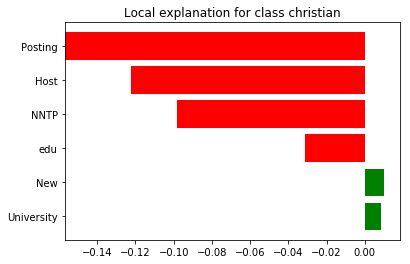

In [93]:
fig = exp.as_pyplot_figure()

In [94]:
exp.show_in_notebook(text=False)

In [95]:
exp.show_in_notebook(text=True)

# Example 2

In [227]:
feature_names = ["Age", "Workclass", "fnlwgt", "Education", "Education-Num", "Marital Status","Occupation", "Relationship", "Race", "Sex", "Capital Gain", "Capital Loss","Hours per week", "Country"]

In [228]:
data = np.genfromtxt('http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data', delimiter=', ', dtype=str)

In [229]:
data

array([['39', 'State-gov', '77516', ..., '40', 'United-States', '<=50K'],
       ['50', 'Self-emp-not-inc', '83311', ..., '13', 'United-States',
        '<=50K'],
       ['38', 'Private', '215646', ..., '40', 'United-States', '<=50K'],
       ..., 
       ['58', 'Private', '151910', ..., '40', 'United-States', '<=50K'],
       ['22', 'Private', '201490', ..., '20', 'United-States', '<=50K'],
       ['52', 'Self-emp-inc', '287927', ..., '40', 'United-States', '>50K']],
      dtype='|S26')

In [230]:
labels = data[:,14]
le= sklearn.preprocessing.LabelEncoder()
le.fit(labels)
labels = le.transform(labels)
class_names = le.classes_
data = data[:,:-1]

In [231]:
categorical_features = [1,3,5, 6,7,8,9,13]

In [232]:
categorical_names = {}
for feature in categorical_features:
    le = sklearn.preprocessing.LabelEncoder()
    le.fit(data[:, feature])
    data[:, feature] = le.transform(data[:, feature])
    categorical_names[feature] = le.classes_

In [257]:
categorical_names

{1: array(['?', 'Federal-gov', 'Local-gov', 'Never-worked', 'Private',
        'Self-emp-inc', 'Self-emp-not-inc', 'State-gov', 'Without-pay'],
       dtype='|S26'),
 3: array(['10th', '11th', '12th', '1st-4th', '5th-6th', '7th-8th', '9th',
        'Assoc-acdm', 'Assoc-voc', 'Bachelors', 'Doctorate', 'HS-grad',
        'Masters', 'Preschool', 'Prof-school', 'Some-college'],
       dtype='|S26'),
 5: array(['Divorced', 'Married-AF-spouse', 'Married-civ-spouse',
        'Married-spouse-absent', 'Never-married', 'Separated', 'Widowed'],
       dtype='|S26'),
 6: array(['?', 'Adm-clerical', 'Armed-Forces', 'Craft-repair',
        'Exec-managerial', 'Farming-fishing', 'Handlers-cleaners',
        'Machine-op-inspct', 'Other-service', 'Priv-house-serv',
        'Prof-specialty', 'Protective-serv', 'Sales', 'Tech-support',
        'Transport-moving'],
       dtype='|S26'),
 7: array(['Husband', 'Not-in-family', 'Other-relative', 'Own-child',
        'Unmarried', 'Wife'],
       dtype='|S26'),

In [233]:
data

array([['39', '7', '77516', ..., '0', '40', '39'],
       ['50', '6', '83311', ..., '0', '13', '39'],
       ['38', '4', '215646', ..., '0', '40', '39'],
       ..., 
       ['58', '4', '151910', ..., '0', '40', '39'],
       ['22', '4', '201490', ..., '0', '20', '39'],
       ['52', '5', '287927', ..., '0', '40', '39']],
      dtype='|S26')

In [234]:
data = data.astype(float)

In [235]:
data

array([[  3.90e+01,   7.00e+00,   7.75e+04, ...,   0.00e+00,   4.00e+01,
          3.90e+01],
       [  5.00e+01,   6.00e+00,   8.33e+04, ...,   0.00e+00,   1.30e+01,
          3.90e+01],
       [  3.80e+01,   4.00e+00,   2.16e+05, ...,   0.00e+00,   4.00e+01,
          3.90e+01],
       ..., 
       [  5.80e+01,   4.00e+00,   1.52e+05, ...,   0.00e+00,   4.00e+01,
          3.90e+01],
       [  2.20e+01,   4.00e+00,   2.01e+05, ...,   0.00e+00,   2.00e+01,
          3.90e+01],
       [  5.20e+01,   5.00e+00,   2.88e+05, ...,   0.00e+00,   4.00e+01,
          3.90e+01]])

In [236]:
encoder = sklearn.preprocessing.OneHotEncoder(categorical_features=categorical_features)

In [238]:
np.random.seed(1)
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(data, labels, train_size=0.80)

In [239]:
encoder.fit(data)
encoded_train = encoder.transform(train)

In [240]:
import xgboost
gbtree = xgboost.XGBClassifier(n_estimators=300, max_depth=5)
gbtree.fit(encoded_train, labels_train)

XGBClassifier(base_score=0.5, colsample_bylevel=1, colsample_bytree=1,
       gamma=0, learning_rate=0.1, max_delta_step=0, max_depth=5,
       min_child_weight=1, missing=None, n_estimators=300, nthread=-1,
       objective='binary:logistic', reg_alpha=0, reg_lambda=1,
       scale_pos_weight=1, seed=0, silent=True, subsample=1)

In [241]:
sklearn.metrics.accuracy_score(labels_test, gbtree.predict(encoder.transform(test)))

0.87102717641639793

In [242]:
predict_fn = lambda x: gbtree.predict_proba(encoder.transform(x)).astype(float)

In [254]:
print (encoded_train.toarray().shape)
encoded_train.toarray()

(26048, 108)


array([[    0.,     0.,     0., ...,     0.,     0.,    40.],
       [    0.,     0.,     0., ...,     0.,     0.,    40.],
       [    0.,     0.,     0., ...,     0.,  1902.,    50.],
       ..., 
       [    0.,     0.,     0., ...,     0.,     0.,    40.],
       [    0.,     0.,     0., ...,     0.,     0.,    40.],
       [    0.,     0.,     0., ...,     0.,  1902.,    45.]])

In [247]:
train

array([[  3.90e+01,   6.00e+00,   1.89e+05, ...,   0.00e+00,   4.00e+01,
          3.90e+01],
       [  5.40e+01,   6.00e+00,   1.05e+05, ...,   0.00e+00,   4.00e+01,
          3.90e+01],
       [  3.20e+01,   4.00e+00,   1.56e+05, ...,   1.90e+03,   5.00e+01,
          3.90e+01],
       ..., 
       [  2.70e+01,   4.00e+00,   1.04e+05, ...,   0.00e+00,   4.00e+01,
          0.00e+00],
       [  5.90e+01,   7.00e+00,   2.69e+05, ...,   0.00e+00,   4.00e+01,
          3.90e+01],
       [  3.30e+01,   4.00e+00,   5.91e+04, ...,   1.90e+03,   4.50e+01,
          3.90e+01]])

In [243]:
explainer = lime.lime_tabular.LimeTabularExplainer(train ,feature_names = feature_names,class_names=class_names,
                                                   categorical_features=categorical_features, 
                                                   categorical_names=categorical_names, kernel_width=3)

In [244]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(test[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)

In [245]:
i = 10
exp = explainer.explain_instance(test[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)

In [246]:
i = 180
exp = explainer.explain_instance(test[i], predict_fn, num_features=5)
exp.show_in_notebook(show_all=False)